In [3]:
import pandas as pd
import numpy as np
from nltk.stem.snowball import SnowballStemmer
from nltk import word_tokenize
from sklearn import manifold
from scipy.sparse.linalg import svds
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
import hdbscan
from sklearn.manifold import TSNE
import numpy as np
import matplotlib.pyplot as plt
import plotly.offline as py
import plotly.graph_objs as go
import seaborn as sns
import sklearn.datasets as data
%matplotlib inline
sns.set_context('poster')
sns.set_style('white')
sns.set_color_codes()
plot_kwds = {'alpha' : 0.5, 's' : 80, 'linewidths':0}
py.init_notebook_mode();

stemmer = SnowballStemmer("english");

# Data Loading and some cleaning

Most of the point of this is to play around with two algorithms. HDBScan is a state of the art unsupervised clustering algorithm that can help you segment ad-hoc data. A major problem is that it's relatively new and many people haven't really discussed it's use since the rage is all NNs, but it's a nice way to get a quick algorithm onto your data without requiring a ton of tuning. t-SNE is also another interesting algorithm that stochastically embeds high dimensional data into lower dimensions, also with minimal tuning required.

To showcase these algorithms, I'm doing some clustering on job post data to see if anything interesting comes out of these algorithms. Let's get started.

In [4]:
# Data from https://www.kaggle.com/madhab/jobposts/data
df = pd.read_csv('jobs.csv');

In [5]:
def cleaner(description):
    ### The stemmer reads the description and cleans the words
    if (type(description) == str):
        return stemmer.stem(description.lower())
    else:
        return ""
    
def cleanSeries(series):
    #runs cleaner on dataframe series
    stored = pd.Series(map(cleaner, series), index=df.index)
    return stored
    
df["cleaned"] = cleanSeries(df["JobDescription"])

Here's where things get tricky. I ran a few of these analyses to start clustering, and I noticed it clustered based on company, meaning it only grouped job posts by descriptions that mentioned the same company. I would like to group job posts by type of job only using the descriptions, so I have a quick step to get the company names from the data and remove them from the job descriptions. The finished product is a vector of word counts for each document with stop words removed.

In [6]:
#Builds words counts for cleaned descriptions

additionalSW = [item for sublist in cleanSeries(df["Company"]).map(lambda x: x.split(" ")) for item in sublist]
stopWords = ENGLISH_STOP_WORDS.union(additionalSW)

cvec = CountVectorizer(stop_words=stopWords, max_df=1.0, ngram_range=(1,2))
cvec.fit(df["cleaned"])
cvec_counts = cvec.transform(df['cleaned'])

In [7]:
cvec_counts.shape

(19001, 86418)

So the final size of the data is 19001 job descriptions, by over 80000 words in the word count vector.

## Data reduction using SVD

My first reaction is to do dimensionality reduction. Originally I would have liked to do t-SNE on just this, but I've found it doesn't work for sparse matrices like the counts matrices, and actually trying to turn this into a dense matrix is impossible since it's about 10^5 * 10^6 values, which is about 10^11 matrix elements. Whatever your number type, it won't fit into memory, so the first step is a SVD reducing the matrix to just 19000 by 256. The rows are now what I call "document signatures".

In [8]:
# Runs Tfidf on counts forming a wrapper for the document word matrix

transformer = TfidfTransformer()
transformed_weights = transformer.fit_transform(cvec_counts)
transformed_weights.shape

# The data reduction step. Run SVD on the document/word matrix to form signatures on documents and words
U, S, V = svds(transformed_weights, k=256)

In [9]:
# This is just a df for the weights that maps words to tfidf for a quick check

weights = np.asarray(transformed_weights.mean(axis=0)).ravel().tolist()
weights_df = pd.DataFrame({'term': cvec.get_feature_names(), 'weight': weights})
weights_df[weights_df['term'] == "java"]

,term,weight
43786,java,0.004273


## t-SNE and HDBScan

Now that we have the signatures and some words are showing up that I like, I'm going to start doing t-SNE on the results. I ended up running it with a range of perplexity values just to have it in memory and play around with it, but in the charts we'll show in the future, I'm going to select one that I feel has the best groupings, mainly one with the highest perplexity.

In [10]:
# Embed the document signatures in 2D using TSNE. This doesn't really work on the groupings
#   since they're defined by the HDBScan, but is kind of nice to look at.

perplexities = range(1, 10);
tsnes = [TSNE(n_components=2, verbose=1, perplexity=2^p, n_iter=1000) for p in perplexities];
tsne_results = [tsne.fit_transform(U) for tsne in tsnes];

[t-SNE] Computing 10 nearest neighbors...
[t-SNE] Indexed 19001 samples in 0.370s...
[t-SNE] Computed neighbors for 19001 samples in 127.642s...
[t-SNE] Computed conditional probabilities for sample 1000 / 19001
[t-SNE] Computed conditional probabilities for sample 2000 / 19001
[t-SNE] Computed conditional probabilities for sample 3000 / 19001
[t-SNE] Computed conditional probabilities for sample 4000 / 19001
[t-SNE] Computed conditional probabilities for sample 5000 / 19001
[t-SNE] Computed conditional probabilities for sample 6000 / 19001
[t-SNE] Computed conditional probabilities for sample 7000 / 19001
[t-SNE] Computed conditional probabilities for sample 8000 / 19001
[t-SNE] Computed conditional probabilities for sample 9000 / 19001
[t-SNE] Computed conditional probabilities for sample 10000 / 19001
[t-SNE] Computed conditional probabilities for sample 11000 / 19001
[t-SNE] Computed conditional probabilities for sample 12000 / 19001
[t-SNE] Computed conditional probabilities for s

[t-SNE] Error after 1000 iterations: 1.813448
[t-SNE] Computing 13 nearest neighbors...
[t-SNE] Indexed 19001 samples in 0.315s...
[t-SNE] Computed neighbors for 19001 samples in 138.622s...
[t-SNE] Computed conditional probabilities for sample 1000 / 19001
[t-SNE] Computed conditional probabilities for sample 2000 / 19001
[t-SNE] Computed conditional probabilities for sample 3000 / 19001
[t-SNE] Computed conditional probabilities for sample 4000 / 19001
[t-SNE] Computed conditional probabilities for sample 5000 / 19001
[t-SNE] Computed conditional probabilities for sample 6000 / 19001
[t-SNE] Computed conditional probabilities for sample 7000 / 19001
[t-SNE] Computed conditional probabilities for sample 8000 / 19001
[t-SNE] Computed conditional probabilities for sample 9000 / 19001
[t-SNE] Computed conditional probabilities for sample 10000 / 19001
[t-SNE] Computed conditional probabilities for sample 11000 / 19001
[t-SNE] Computed conditional probabilities for sample 12000 / 19001
[t

Here's the meat of the code. Doing HDBScan on the signatures to try and tease out some groupings.

In [11]:
# Cluster using hdbscan on the signatures
# clusterer = hdbscan.HDBSCAN(min_cluster_size=10)
nns = [3,4,5];
clusterers = [hdbscan.RobustSingleLinkage(cut=0.125, k=(2**n)) for n in nns];
clusterLabels = [clusterer.fit_predict(U) for clusterer in clusterers];
#clusterer.condensed_tree_.plot(select_clusters=True, selection_palette=sns.color_palette())

#Get a quick visualization of the clustering results. This is not wildly good since
# we're taking the TSNE of the signatures, then coloring by HDBScan on the signatures
# but it may give a quick way to see how well the HDBScan is doing



And here are some pictures. The idea is that the colorings are the HDBScan on the signatures, and t-SNE is just a nice grouping algorithm already. Now we start being able to compare both algorithms and the first thing I notice is t-SNE is actually doing better groupings than the HDBScan. Everything is just one color, while in the position dimension, there's a lot of structure.

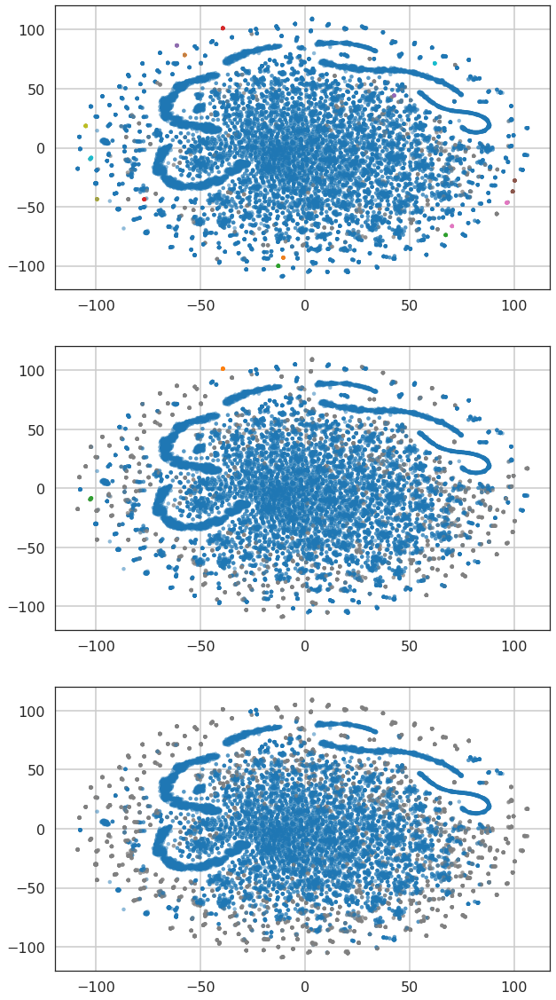

In [12]:
palette = sns.color_palette();
s = 310;
tsne = 8;
plt.figure(figsize=(10, 20))
for clusterer in clusterers:
    s+=1
    plt.subplot(s)
    cluster_colors = [sns.desaturate(palette[col % 10], 1)
        if col >= 0 else (0.5, 0.5, 0.5) for col in 
        clusterer.labels_];
    plt.scatter(tsne_results[tsne][:,0],tsne_results[tsne][:,1], c=cluster_colors, marker='.', **plot_kwds)
    plt.grid(True)
plt.show()

## HDBScan after t-SNE

Previously, we ran HDBScan and t-SNE on the same signatures. This time, let's run t-SNE on the signatures, then HDBScan the t-SNE results. This may seem odd since we are essentially doing one round of data reduction, followed by another round of data reduction using a stochastic algorithm, but this actually might give some good results considering the t-SNE is giving some great physical grouping but the HDBScan doesn't seem to be clustering at all.

In [ ]:
largeTSNE = TSNE(n_components=3, verbose=1, perplexity=40, n_iter=5000);
ltresults = largeTSNE.fit_transform(U);

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 19001 samples in 0.300s...
[t-SNE] Computed neighbors for 19001 samples in 153.033s...
[t-SNE] Computed conditional probabilities for sample 1000 / 19001
[t-SNE] Computed conditional probabilities for sample 2000 / 19001
[t-SNE] Computed conditional probabilities for sample 3000 / 19001
[t-SNE] Computed conditional probabilities for sample 4000 / 19001
[t-SNE] Computed conditional probabilities for sample 5000 / 19001
[t-SNE] Computed conditional probabilities for sample 6000 / 19001
[t-SNE] Computed conditional probabilities for sample 7000 / 19001
[t-SNE] Computed conditional probabilities for sample 8000 / 19001
[t-SNE] Computed conditional probabilities for sample 9000 / 19001
[t-SNE] Computed conditional probabilities for sample 10000 / 19001
[t-SNE] Computed conditional probabilities for sample 11000 / 19001
[t-SNE] Computed conditional probabilities for sample 12000 / 19001
[t-SNE] Computed conditional probabilities for 

In [32]:
tsneResultsClusterer = hdbscan.HDBSCAN(min_cluster_size=20);
tsneResultsClusterer.fit_predict(ltresults);

In [64]:
trace = go.Scatter(
    x=ltresults[:,0],
    y=ltresults[:,1],
    mode='markers',
    marker=dict(
        color=tsneResultsClusterer.labels_,
        colorscale='Viridis',
        size=2,
        symbol='circle',
        opacity=0.9
    ),
    text=df["Title"],
    name=tsneResultsClusterer.labels_
)
layout = go.Layout(
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    )
)
fig = go.Figure(data=[trace], layout=layout)
py.iplot(fig)

Here the yellow trail indicates an interesting group to explore, but the smaller clusters seem to be of interest as well. If we drill down into the smaller groups and hover the elements, we can see the clusters are related to similar job postings in the t-SNE positions, but keep in mind this was 3D t-SNE so there is mixing of clustering results in the z dimension. The 3d t-SNE was chosen to give some better results for the HDBScan and possibly visualize in 3D, but could not be rendered due to the size of the data.

We can see the counts of the groups below, and see the 260 group seems to be related to "Monitoring".

In [49]:
counts = {};
for result in tsneResultsClusterer.labels_:
    if result in counts:
        counts[result] += 1
    else:
        counts[result] = 1
counts

{-1: 5981,
 0: 16,
 1: 16,
 2: 11,
 3: 15,
 4: 19,
 5: 11,
 6: 11,
 7: 13,
 8: 18,
 9: 12,
 10: 15,
 11: 16,
 12: 16,
 13: 19,
 14: 21,
 15: 22,
 16: 19,
 17: 16,
 18: 15,
 19: 23,
 20: 17,
 21: 13,
 22: 14,
 23: 27,
 24: 32,
 25: 25,
 26: 15,
 27: 33,
 28: 38,
 29: 20,
 30: 13,
 31: 19,
 32: 27,
 33: 26,
 34: 17,
 35: 11,
 36: 14,
 37: 15,
 38: 14,
 39: 18,
 40: 34,
 41: 33,
 42: 21,
 43: 23,
 44: 16,
 45: 21,
 46: 23,
 47: 10,
 48: 11,
 49: 38,
 50: 25,
 51: 24,
 52: 17,
 53: 15,
 54: 13,
 55: 70,
 56: 12,
 57: 13,
 58: 13,
 59: 30,
 60: 11,
 61: 30,
 62: 14,
 63: 34,
 64: 15,
 65: 54,
 66: 65,
 67: 16,
 68: 20,
 69: 21,
 70: 17,
 71: 67,
 72: 32,
 73: 23,
 74: 39,
 75: 26,
 76: 21,
 77: 45,
 78: 28,
 79: 25,
 80: 15,
 81: 28,
 82: 12,
 83: 47,
 84: 55,
 85: 13,
 86: 17,
 87: 42,
 88: 44,
 89: 73,
 90: 12,
 91: 36,
 92: 22,
 93: 36,
 94: 15,
 95: 58,
 96: 73,
 97: 37,
 98: 28,
 99: 29,
 100: 35,
 101: 14,
 102: 20,
 103: 13,
 104: 14,
 105: 10,
 106: 31,
 107: 49,
 108: 43,
 109: 68,

In [58]:
df['tsneResultsLabels'] = tsneResultsClusterer.labels_;
df[df['tsneResultsLabels'] == 260]

,jobpost,date,Title,Company,AnnouncementCode,Term,Eligibility,Audience,StartDate,Duration,...,OpeningDate,Deadline,Notes,AboutC,Attach,Year,Month,IT,cleaned,tsneResultsLabels
50,Armenian Caritas\r\nJOB TITLE: Programs Manag...,"Feb 4, 2004",Programs Manager,Armenian Caritas,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,20 February 2004,NaN,NaN,NaN,2004,2,False,armenian caritas is seeking an experienced pro...,260
315,World Vision Armenia\r\nTITLE: Global Fund PR...,Jun 3 11:37 AM,Global Fund PRIU Team Leader,World Vision Armenia,NaN,NaN,NaN,NaN,As soon as possible,NaN,...,03 June 2004,"Friday, 18 June 2004.",NaN,World Vision came to Armenia fifteen years ago...,NaN,2004,6,False,the principal recipient implementation unit (p...,260
449,World Vision Armenia\r\nTITLE: Global Fund AT...,"Jul 21, 2004",Global Fund ATM Implementation Unit Officer,World Vision Armenia,NaN,NaN,All interested candidates,NaN,"01 September, 2004",NaN,...,21 July 2004,04 August 2004,No information inquiries will be handled over ...,World Vision came to Armenia fifteen years ago...,NaN,2004,7,False,to work collaboratively with the program imple...,260
506,World Vision Armenia\r\nTITLE: Global Fund Of...,"Aug 10, 2004",Global Fund Officer (Re-announcement),World Vision Armenia,NaN,NaN,All Interested Candidates,NaN,As soon as possible,NaN,...,10 August 2004,24 August 2004,No information inquiries will be handled over ...,World Vision came to Armenia fifteen years ago...,NaN,2004,8,False,to work collaboratively with the program imple...,260
568,CNFA Inc.\r\nTITLE: Program Coordinator\r\nST...,"Sep 7, 2004",Program Coordinator,CNFA Inc.,NaN,NaN,NaN,NaN,01 October 2004,NaN,...,NaN,17 September 2004,NaN,NaN,NaN,2004,9,False,under the supervision of cnfas vice president ...,260
802,Chemonics International Inc.\r\nTITLE: Perfor...,"Dec 8, 2004",Performance Monitoring and Evaluation Specialist,Chemonics International Inc.,NaN,NaN,NaN,NaN,March 2005,NaN,...,08 December 2004,13 December 2004,NaN,Chemonics International is a global consulting...,NaN,2004,12,False,develop and manage monitoring and evaluation p...,260
1314,IntraHealth International\r\nTITLE: Monitorin...,"May 11, 2005",Monitoring and Evaluation Officer,IntraHealth International,NaN,NaN,NaN,NaN,NaN,5 years,...,11 May 2005,20 May 2005,NaN,IntraHealth International is an international\...,NaN,2005,5,False,this position is responsible for designing and...,260
1778,PA Government Services Inc.\r\nTITLE: Water R...,"Sep 27, 2005",Water Resources Monitoring Specialist,PA Government Services Inc.,NaN,Full or part time,NaN,NaN,NaN,Long-term,...,26 September 2005,21 October 2005\r\nABOUT: The USAID funded Pr...,NaN,NaN,NaN,2005,9,False,the water resources monitoring specialist will...,260
1779,PA Government Services Inc.\r\nTITLE: Groundw...,"Sep 27, 2005",Groundwater Monitoring Specialist,PA Government Services Inc.,NaN,NaN,NaN,NaN,NaN,NaN,...,26 September 2005,21 October 2005\r\nABOUT: The USAID funded Pr...,NaN,NaN,NaN,2005,9,False,the groundwater monitoring specialist will wor...,260
1831,"Counterpart International, Armenia\r\nTITLE: ...","Oct 18, 2005",Monitoring and Evaluation Specialist,"Counterpart International, Armenia",NaN,NaN,All qualified candidates,NaN,NaN,Long term,...,17 October 2005,"31 October 2005, 16:00 p.m.",Start-up professionals with a combination of a...,Counterpart International in Armenia is the im...,The following attachment(s) to this announceme...,2005,10,False,monitoring and evaluation specialist is respon...,260


Another interesting group is below, which seems to be related to translator jobs.

In [59]:
df[df['tsneResultsLabels'] == 206]

,jobpost,date,Title,Company,AnnouncementCode,Term,Eligibility,Audience,StartDate,Duration,...,OpeningDate,Deadline,Notes,AboutC,Attach,Year,Month,IT,cleaned,tsneResultsLabels
93,"EU TACIS Project ""Support to the Development o...","Feb 28, 2004",Translator/ Interpreter (AVET3),"EU TACIS Project ""Support to the Development o...",NaN,NaN,NaN,NaN,NaN,Contracts of employment will be for a total of...,...,NaN,06 March 2004\r\nSTART DATE: Successful cand...,NaN,NaN,NaN,2004,2,False,ifoa the international consulting company whic...,206
97,Medecins Sans Frontieres - Belgium\r\nJOB TITL...,"Feb 28, 2004",English Translator/ Interpreter,Medecins Sans Frontieres - Belgium,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,08 March 2004,NaN,NaN,NaN,2004,2,False,medecins sans frontieres - belgium is seeking ...,206
174,Barents Group of BearingPoint\r\nUSAID Commerc...,"Apr 1, 2004",Translator (general),Barents Group of BearingPoint\r\nUSAID Commerc...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,14 April 2004,NaN,NaN,NaN,2004,4,False,barents group is looking for a full-time trans...,206
177,Barents Group of BearingPoint\r\nUSAID Commerc...,"Apr 1, 2004",Translator (Telecommunications/ Regulatory/ IT),Barents Group of BearingPoint\r\nUSAID Commerc...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,14 April 2004,NaN,NaN,NaN,2004,4,False,barents group is looking for a full-time trans...,206
438,Yerevan Physics Institute\r\nTITLE: Translato...,"Jul 18, 2004",Translator,Yerevan Physics Institute,NaN,NaN,NaN,NaN,01 Autust 2004,NaN,...,18 July 2004,25 July 2004,NaN,NaN,NaN,2004,7,False,the translator will work on the documentation\...,206
679,The Pragma Corporation\r\nTITLE: Translator-I...,"Oct 20, 2004",Translator-Interpreters,The Pragma Corporation,NaN,Full-Time,NaN,NaN,NaN,NaN,...,20 October 2004,03 November 2004,NaN,NaN,NaN,2004,10,False,pragma is seeking translator-interpreters to w...,206
732,Armenian Translators Worldwide\r\nTITLE: Free...,"Nov 10, 2004",Freelance English Translators,Armenian Translators Worldwide,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,Open,NaN,NaN,NaN,2004,11,False,the international translation agency is lookin...,206
895,ISO Consulting Ltd\r\nTITLE: French-Russian-A...,"Jan 11, 2005",French-Russian-Armenian Language Translator/ I...,ISO Consulting Ltd,NaN,Part time: 4 hours/day,All qualified candidates,NaN,Immediate,Long term,...,11 January 2005,31 January 2005,NaN,ISO Consulting LTD is an Armenian-French compa...,NaN,2005,1,False,provide quality and in time translations and\r...,206
896,ISO Consulting Ltd\r\nTITLE: English-Russian-...,"Jan 11, 2005",English-Russian-Armenian Language Translator/ ...,ISO Consulting Ltd,NaN,Part time: 4 hours/day,NaN,NaN,Immediate,Long term,...,11 January 2005,31 January 2005,NaN,"""ISO Consulting"" LTD is an Armenian-French com...",NaN,2005,1,False,provide quality and in time translations and\r...,206
965,ADE s.a.\r\nTITLE: English - Armenian Languag...,"Jan 28, 2005",English - Armenian Language Translator/ Interp...,ADE s.a.,NaN,NaN,NaN,NaN,07 February 2005,2-3 weeks,...,27 January 2005,"31 January 2005, 17:00",NaN,ADE s.a. is a Belgium-based consulting company...,NaN,2005,1,False,provide quality and in time (mostly verbal)\r...,206


It looks like the combination of t-SNE and HDBScan is a nice way to try and identify small related groups in an unsupervised set of entities. This may provide an efficient way to start the labeling process for a previously unlabeled set, since it is much easier to scan through 200 groups than 19000 entities.